# Time Series Forcasting using Prophet

#### Importing Libraries

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error

#### Importing Dataset

In [2]:
data = pd.read_csv(r'C:\Users\LENOVO\Desktop\Internship\CipherByte Technoligies\Task-3\weather_data_kolkata_2015_2020.csv')

In [3]:
#View data
data.head()

,DATETIME,TEMPERATURE,HUMIDITY
0,2015-01-01 00:00:00,19.0,75.0
1,2015-01-01 01:00:00,19.0,77.0
2,2015-01-01 02:00:00,19.0,78.0
3,2015-01-01 03:00:00,19.0,80.0
4,2015-01-01 04:00:00,19.0,81.0


In [4]:
#view data
data.tail()

,DATETIME,TEMPERATURE,HUMIDITY
52603,2020-12-31 19:00:00,25.0,36.0
52604,2020-12-31 20:00:00,24.0,37.0
52605,2020-12-31 21:00:00,23.0,38.0
52606,2020-12-31 22:00:00,22.0,39.0
52607,2020-12-31 23:00:00,21.0,40.0


In [5]:
#checking the shape of the data
data.shape

(52608, 3)

In [6]:
#checking if there is any null value in th dataset
data.isnull().sum()

DATETIME       0
TEMPERATURE    0
HUMIDITY       0
dtype: int64

In [7]:
#checking if there is any null value in th dataset
data.duplicated().sum()

0

#### Statistical Measure

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
TEMPERATURE,52608.0,28.187633,4.946404,11.0,25.0,29.0,31.0,45.0
HUMIDITY,52608.0,58.871693,18.935218,8.0,44.0,60.0,75.0,98.0


#### Inferences:

      "TEMPERATURE":
- The average temperature is around 28.19°C.
- Temperatures have a small standard deviation of about 4.95°C.
- The range of temperatures is between 11.0°C and 45.0°C.
- The middle 50% of temperatures falls between 25.0°C and 31.0°C.

      "HUMIDITY":
- The average humidity is approximately 58.87%.
- Humidity values have a wider spread with a standard deviation of about 18.94%.
- Humidity ranges from 8.0% to 98.0%.
- The middle 50% of humidity levels ranges from 44.0% to 75.0%.

#### Visualising Data

In [9]:
#plotting temperature data
figure = px.line(data, x="DATETIME", 
                 y="TEMPERATURE", 
                 title='Temperature in Kolkata Over the Years')
figure.show()

In [10]:
#plotting humidity data
figure = px.line(data, x="DATETIME", 
                 y="HUMIDITY", 
                 title='Temperature in Kolkata Over the Years')
figure.show()

#### Data Preprocessing

In [11]:
#checking Info of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52608 entries, 0 to 52607
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATETIME     52608 non-null  object 
 1   TEMPERATURE  52608 non-null  float64
 2   HUMIDITY     52608 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.2+ MB


In [12]:
data['DATETIME'] = pd.to_datetime(data['DATETIME'])

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52608 entries, 0 to 52607
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   DATETIME     52608 non-null  datetime64[ns]
 1   TEMPERATURE  52608 non-null  float64       
 2   HUMIDITY     52608 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 1.2 MB


In [14]:
data.head(25)

,DATETIME,TEMPERATURE,HUMIDITY
0,2015-01-01 00:00:00,19.0,75.0
1,2015-01-01 01:00:00,19.0,77.0
2,2015-01-01 02:00:00,19.0,78.0
3,2015-01-01 03:00:00,19.0,80.0
4,2015-01-01 04:00:00,19.0,81.0
5,2015-01-01 05:00:00,20.0,83.0
6,2015-01-01 06:00:00,20.0,84.0
7,2015-01-01 07:00:00,20.0,82.0
8,2015-01-01 08:00:00,21.0,80.0
9,2015-01-01 09:00:00,22.0,78.0


#### Inferece:
        There is hourly temperature and humidity data for each date. To calculate the date-wise mean temperature and mean    humidity, have to compute the average values.

In [15]:
# Extracting  date from the 'DATETIME' column
data['DATE'] = data['DATETIME'].dt.date

data

,DATETIME,TEMPERATURE,HUMIDITY,DATE
0,2015-01-01 00:00:00,19.0,75.0,2015-01-01
1,2015-01-01 01:00:00,19.0,77.0,2015-01-01
2,2015-01-01 02:00:00,19.0,78.0,2015-01-01
3,2015-01-01 03:00:00,19.0,80.0,2015-01-01
4,2015-01-01 04:00:00,19.0,81.0,2015-01-01
...,...,...,...,...
52603,2020-12-31 19:00:00,25.0,36.0,2020-12-31
52604,2020-12-31 20:00:00,24.0,37.0,2020-12-31
52605,2020-12-31 21:00:00,23.0,38.0,2020-12-31
52606,2020-12-31 22:00:00,22.0,39.0,2020-12-31


In [16]:
# Group by data using date and calculate the average temperature and humidity
datewise_data = data.groupby('DATE').agg({'TEMPERATURE': 'mean', 'HUMIDITY': 'mean'}).reset_index()

In [17]:
#view the date-wise dataset
datewise_data 

,DATE,TEMPERATURE,HUMIDITY
0,2015-01-01,20.333333,83.208333
1,2015-01-02,23.041667,76.208333
2,2015-01-03,24.375000,76.750000
3,2015-01-04,23.916667,68.250000
4,2015-01-05,21.250000,51.375000
...,...,...,...
2187,2020-12-27,23.083333,28.583333
2188,2020-12-28,23.958333,30.250000
2189,2020-12-29,24.750000,32.458333
2190,2020-12-30,23.875000,34.125000


In [18]:
#shape of the final dataset
datewise_data.shape

(2192, 3)

#### Visualising the final data

In [19]:
#plotting temperatue data
figure = px.line(datewise_data, x="DATE", 
                 y="TEMPERATURE", 
                 title='Temperature in Kolkata Over the Years',
                color_discrete_sequence=['red'])
figure.show()

In [20]:
#plotting humidity data
figure = px.line(datewise_data, x="DATE", 
                 y="HUMIDITY", 
                 title='Temperature in Kolkata Over the Years',
                color_discrete_sequence=['dark blue'])
figure.show()

In [21]:
#converting date column to datetime
datewise_data['DATE'] = pd.to_datetime(datewise_data['DATE'])

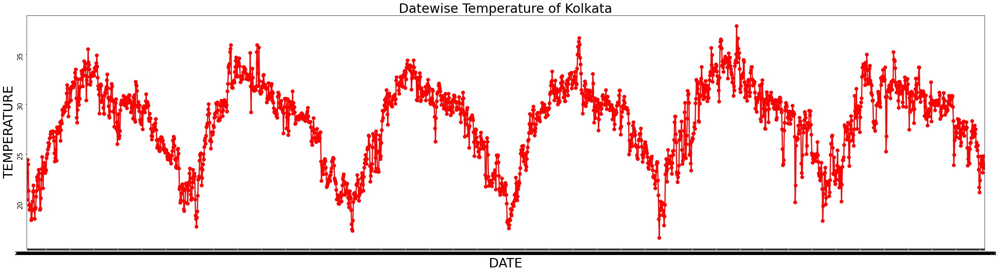

In [22]:
# #plotting date-wise temperature data using seaborn
plt.figure(figsize=(40,10))
plt.yticks(rotation = 90,fontsize=15)
plt.xlabel("DATE",fontsize=30)
plt.ylabel("TEMPERATURE",fontsize=30)

#define title
plt.title("Datewise Temperature of Kolkata",fontsize=30)

#using the .dt accessor as the 'DATE' column is in datetime format
ax = sns.pointplot(x=datewise_data['DATE'].dt.date, y=datewise_data['TEMPERATURE'], color='r')
ax.set(xlabel="DATE", ylabel="TEMPERATURE")

plt.show()

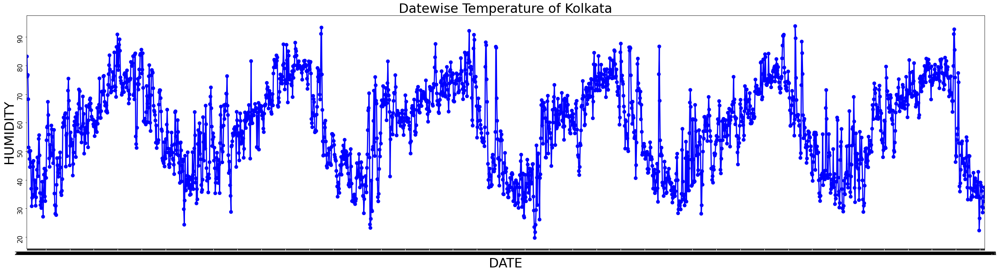

In [23]:
#plotting date-wise humidity data using seaborn
plt.figure(figsize=(40,10))
#plt.xticks(rotation=70,fontsize=2)
plt.yticks(rotation = 90,fontsize=15)
plt.xlabel("DATE",fontsize=30)
plt.ylabel("HUMIDITY",fontsize=30)

#define title
plt.title("Datewise Temperature of Kolkata",fontsize=30)

#using the .dt accessor as the 'DATE' column is in datetime format
ax = sns.pointplot(x=datewise_data['DATE'].dt.date, y=datewise_data['HUMIDITY'], color='b')
ax.set(xlabel="DATE", ylabel="HUMIDITY")

plt.show()

In [24]:
# Create a scatter plot with trendline, and customize color
figure = px.scatter(data_frame=datewise_data, x="HUMIDITY", y="TEMPERATURE",
                    trendline="ols",  #size="TEMPERATURE",
                    title="Relationship Between Temperature and Humidity",
                    color_discrete_sequence=['green'])  # Set scatter points color

# Update the trendline color
figure.update_traces(line=dict(color='red'))  # Set trendline color

# Show the plot
figure.show()

#### Inference:
    The figure indicates a moderately positive relationship between temperature and humidity.

In [25]:
#fetching Year and month from the date
datewise_data['Year'] = datewise_data["DATE"].dt.year
datewise_data["Month"] = datewise_data["DATE"].dt.month

In [26]:
#checking the new dataset
datewise_data.head()

,DATE,TEMPERATURE,HUMIDITY,Year,Month
0,2015-01-01,20.333333,83.208333,2015,1
1,2015-01-02,23.041667,76.208333,2015,1
2,2015-01-03,24.375000,76.750000,2015,1
3,2015-01-04,23.916667,68.250000,2015,1
4,2015-01-05,21.250000,51.375000,2015,1


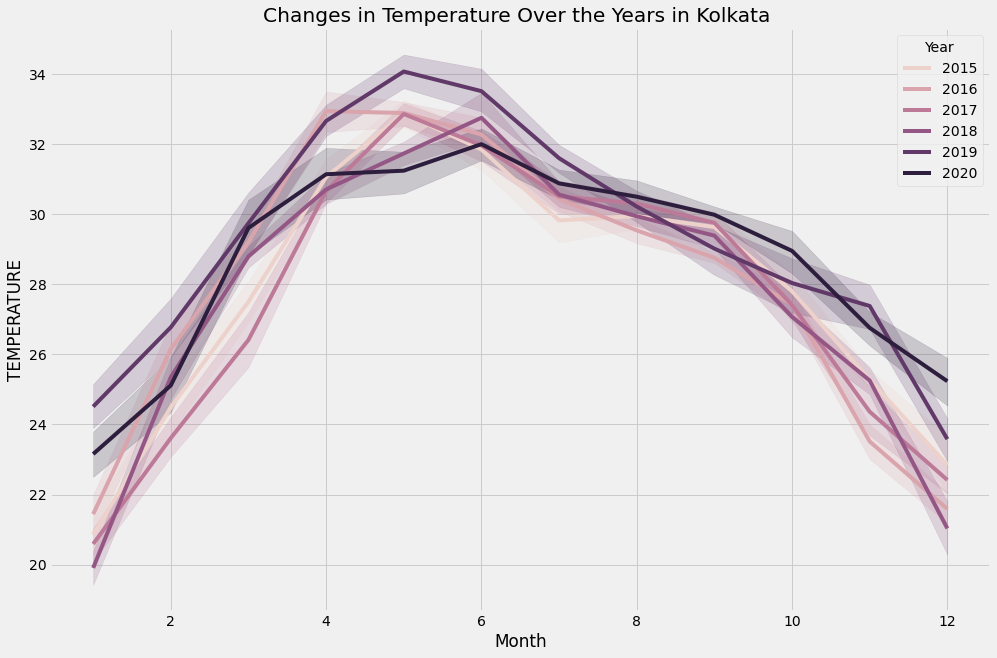

In [27]:
#plotting changes in temperature over years
plt.style.use('fivethirtyeight')
plt.figure(figsize=(15, 10))
plt.title("Changes in Temperature Over the Years in Kolkata ")
sns.lineplot(data = datewise_data, x='Month', y='TEMPERATURE', hue='Year')
plt.show()

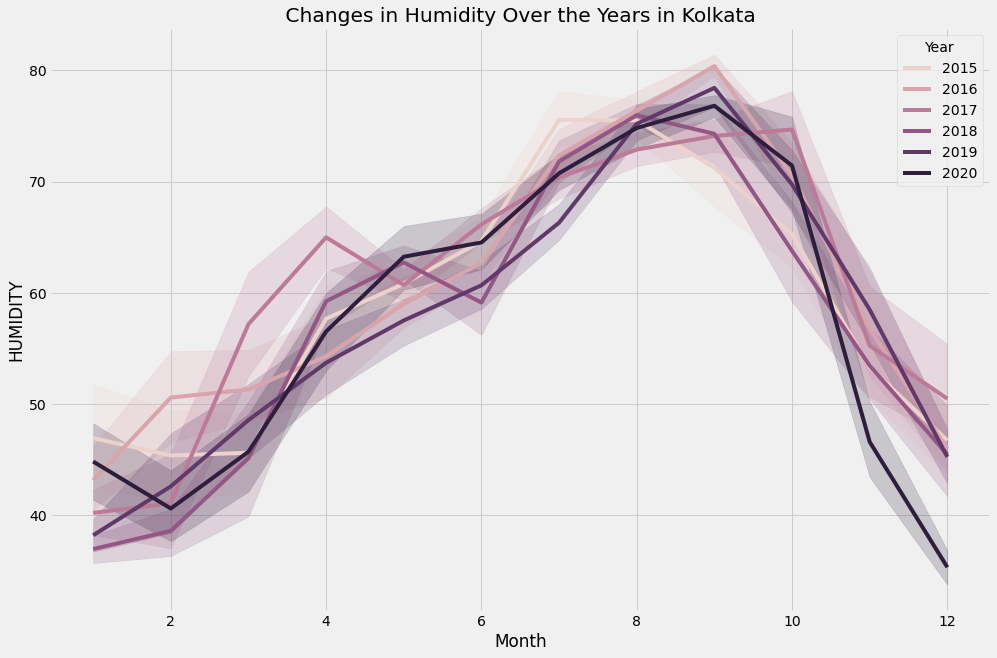

In [28]:
#plotting changes in humidity over years
plt.style.use('fivethirtyeight')
plt.figure(figsize=(15, 10))
plt.title(" Changes in Humidity Over the Years in Kolkata ")
sns.lineplot(data = datewise_data, x='Month', y='HUMIDITY', hue='Year')
plt.show()

Inferences:
    It is evident that both temperature and humidity in Kolkata were lower in 2020 compared to the previous years.

## Predicting Temperature using Prophet

In [29]:
#preprocessing data
forecast_data = datewise_data.rename(columns = {"DATE": "ds", 
                                       "TEMPERATURE": "y"})

In [30]:
#viewing the data
forecast_data.head()

,ds,y,HUMIDITY,Year,Month
0,2015-01-01,20.333333,83.208333,2015,1
1,2015-01-02,23.041667,76.208333,2015,1
2,2015-01-03,24.375000,76.750000,2015,1
3,2015-01-04,23.916667,68.250000,2015,1
4,2015-01-05,21.250000,51.375000,2015,1


In [31]:
#temperature dataframe
forecast_temperature_data = forecast_data.drop(['HUMIDITY', 'Year', 'Month'], axis = 1)

In [32]:
#view data
forecast_temperature_data.head()

,ds,y
0,2015-01-01,20.333333
1,2015-01-02,23.041667
2,2015-01-03,24.375000
3,2015-01-04,23.916667
4,2015-01-05,21.250000


In [33]:
#import important librariesto build model
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
import plotly.graph_objs as go

In [35]:
#define model
model_temp = Prophet()

#fit model
model_temp.fit(forecast_temperature_data)

#defining the prediction timeframe i.e. next 1 year
forecasts_temp = model_temp.make_future_dataframe(periods=365)

#generating predictions
predictions_temp = model_temp.predict(forecasts_temp)

#plotting data using plot_plotly
fig_temp = plot_plotly(model_temp, predictions_temp)

# update the layout to add a title
fig_temp.update_layout(
    title="Forecasted Temperature using Prophet"
)

# Show the Plotly figure
fig_temp.show()

20:58:29 - cmdstanpy - INFO - Chain [1] start processing
20:58:30 - cmdstanpy - INFO - Chain [1] done processing


#### Evaluation of model using RMSE and MAE

In [36]:
# Extract relevant columns for evaluation
actual_temp_values = forecast_temperature_data['y'].values

# Keeping only matching number of samples
predicted_temp_values = predictions_temp['yhat'].values[:len(actual_temp_values)] 

# Calculate RMSE and MAE
rmse = np.sqrt(mean_squared_error(actual_temp_values, predicted_temp_values))
mae = mean_absolute_error(actual_temp_values, predicted_temp_values)

print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")

Root Mean Squared Error (RMSE): 1.505719300723573
Mean Absolute Error (MAE): 1.1295968759224677


#### Inferences drawn from the Root Mean Squared Error (RMSE) and Mean Absolute Error (MAE):

    1. The RMSE value of 1.51 indicates that, on average, the predicted values from the model deviate from the actual values by approximately 1.51 units. This low value suggests that the model's predictions are generally close to the actual values.

    2. The MAE value of 1.13 signifies that, on average, the absolute difference between the predicted and actual values is around 1.13 units. A lower MAE indicates better accuracy in the predictions.

    3. Both the low RMSE and MAE values suggest that the model's predictions are accurate and have a minimal deviation from the actual values. This indicates a good fit between the model and the data, and the model is likely performing well in forecasting the target variable.

## Predicting Humidity using Prophet

In [37]:
#humidity dataframe
forecast_humidity_data = datewise_data[['DATE','HUMIDITY']]

In [38]:
#view data
forecast_humidity_data.head()

,DATE,HUMIDITY
0,2015-01-01,83.208333
1,2015-01-02,76.208333
2,2015-01-03,76.750000
3,2015-01-04,68.250000
4,2015-01-05,51.375000


In [39]:
#renaming columns
forecast_humidity_data = forecast_humidity_data.rename(columns={"DATE" : "ds", "HUMIDITY": "y"})

In [40]:
#view the final data
forecast_humidity_data.head()

,ds,y
0,2015-01-01,83.208333
1,2015-01-02,76.208333
2,2015-01-03,76.750000
3,2015-01-04,68.250000
4,2015-01-05,51.375000


In [43]:
#define model
model_humidity = Prophet()

#fit the model
model_humidity.fit(forecast_humidity_data)

#defining the prediction timeframe i.e. next 1 year
forecasts_humidity = model_humidity.make_future_dataframe(periods=365)

#generating predictions
predictions_humidity = model_humidity.predict(forecasts_humidity)

#plotting data using plot_plotly
fig_humidity = plot_plotly(model_humidity, predictions_humidity)

# updating the layout to add a title
fig_temp.update_layout(
    title="Forecasted Humidity using Prophet"
)

# Show the Plotly figure
fig_temp.show()

20:59:17 - cmdstanpy - INFO - Chain [1] start processing
20:59:17 - cmdstanpy - INFO - Chain [1] done processing


### Evaluation of model using RMSE and MAE

In [44]:
# Extract relevant columns for evaluation
actual_humidity_values = forecast_humidity_data['y'].values

# Keep only matching number of samples
predicted_humidity_values = predictions_humidity['yhat'].values[:len(actual_humidity_values)] 

# Calculate RMSE and MAE
rmse = np.sqrt(mean_squared_error(actual_humidity_values, predicted_humidity_values))
mae = mean_absolute_error(actual_humidity_values, predicted_humidity_values)

print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")

Root Mean Squared Error (RMSE): 8.472686188537716
Mean Absolute Error (MAE): 6.3092283330774075


#### Inferences drawn from the Root Mean Squared Error (RMSE) and Mean Absolute Error (MAE):

    1. The RMSE value of 33.43 suggests that, on average, the predicted values deviate from the actual values by around 33.43 units. 
    2. The MAE value of 30.71 indicates that, on average, the absolute difference between the predicted and actual values is approximately 30.71 units.
    3. The values obtained suggest that the model's predictions are somewhat accurate, but there might still be room for improvement to reduce the errors further.